In [16]:
import os
import urllib.request
import zipfile
import json
import nibabel as nib
import numpy as np
import matplotlib.pyplot as plt

In [17]:
## Utils
def load_json_file(filepath):
    with open(filepath, 'r') as file:
        data = json.load(file)
    return data


def filter_file_paths_from_json(jsonData, filterString='0001'):
    filteredData = []
    for i in range(len(jsonData['training_paired_images'])):
        tmproot, tmpext = os.path.splitext(jsonData['training_paired_images'][i]['moving'])
        root, ext = os.path.splitext(tmproot)
        splitRoot = root.split('_')
        if splitRoot[-1] == filterString:
            filteredData.append(jsonData['training_paired_images'][i])

    return filteredData


def load_data_from_filtered_paths(paths, dataFolderPath):
    fixedData = []
    movingData = []
    for image in paths:
        fixedImg = nib.load(dataFolderPath + image['fixed'].removeprefix('.')).get_fdata()
        fixedData.append(fixedImg)
        movingImg = nib.load(dataFolderPath + image['moving'].removeprefix('.')).get_fdata()
        movingData.append(movingImg)

    return fixedData, movingData



In [18]:
dataFolder = './data/COMULISSHGBF'
jsonPath = dataFolder + '/COMULISSHGBF_dataset.json'

In [19]:
jsonData = load_json_file(jsonPath)

In [20]:
filteredData = filter_file_paths_from_json(jsonData, '0001')
filteredData

[{'fixed': './imagesTr/COMULISSHGBF_0000_0000.nii.gz',
  'moving': './imagesTr/COMULISSHGBF_0000_0001.nii.gz'},
 {'fixed': './imagesTr/COMULISSHGBF_0001_0000.nii.gz',
  'moving': './imagesTr/COMULISSHGBF_0001_0001.nii.gz'},
 {'fixed': './imagesTr/COMULISSHGBF_0002_0000.nii.gz',
  'moving': './imagesTr/COMULISSHGBF_0002_0001.nii.gz'},
 {'fixed': './imagesTr/COMULISSHGBF_0003_0000.nii.gz',
  'moving': './imagesTr/COMULISSHGBF_0003_0001.nii.gz'},
 {'fixed': './imagesTr/COMULISSHGBF_0004_0000.nii.gz',
  'moving': './imagesTr/COMULISSHGBF_0004_0001.nii.gz'},
 {'fixed': './imagesTr/COMULISSHGBF_0005_0000.nii.gz',
  'moving': './imagesTr/COMULISSHGBF_0005_0001.nii.gz'},
 {'fixed': './imagesTr/COMULISSHGBF_0006_0000.nii.gz',
  'moving': './imagesTr/COMULISSHGBF_0006_0001.nii.gz'},
 {'fixed': './imagesTr/COMULISSHGBF_0007_0000.nii.gz',
  'moving': './imagesTr/COMULISSHGBF_0007_0001.nii.gz'},
 {'fixed': './imagesTr/COMULISSHGBF_0008_0000.nii.gz',
  'moving': './imagesTr/COMULISSHGBF_0008_0001.ni

In [21]:
fixedData, movingData = load_data_from_filtered_paths(filteredData, dataFolder)

print(len(fixedData))
print(len(movingData))

166
166


In [13]:
print(fixedData[0].shape)
print(movingData[0].shape)

(834, 834, 1)
(834, 834, 1, 1, 3)


In [37]:
image = 6

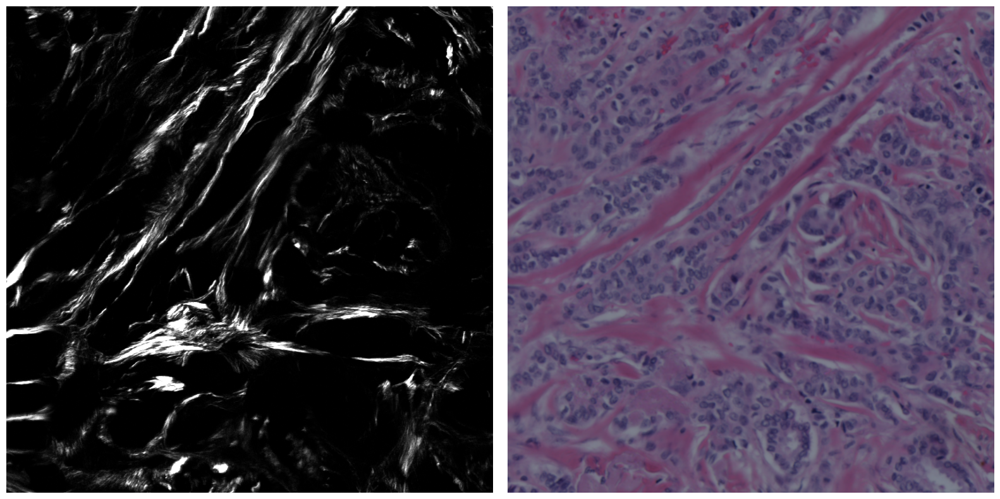

In [38]:
fig, axes = plt.subplots(ncols=2, figsize=(16, 8))
axes[0].imshow(fixedData[image], cmap="gray")
axes[0].axis("off")
axes[1].imshow(movingData[image][:, :, 0, 0].astype(np.uint8))
axes[1].axis("off")
fig.tight_layout()

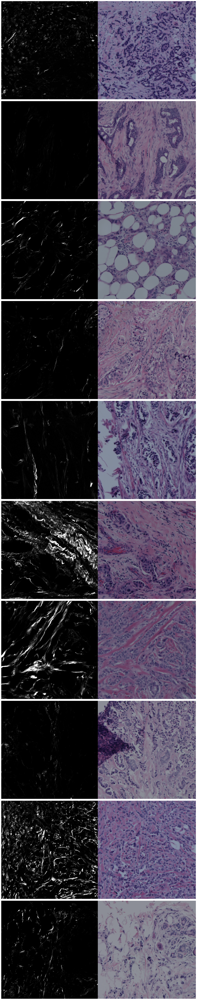

In [24]:
num_pairs = 10
# Create a figure with the necessary number of subplots
fig, axes = plt.subplots(nrows=num_pairs, ncols=2, figsize=(16, 8 * num_pairs))

for i in range(num_pairs):
    # Display the first image in the pair
    axes[i, 0].imshow(fixedData[i], cmap="gray")
    axes[i, 0].axis("off")
    
    # Display the second image in the pair
    axes[i, 1].imshow(movingData[i][:, :, 0, 0].astype(np.uint8))
    axes[i, 1].axis("off")

# Adjust layout to prevent overlapping
plt.tight_layout()
plt.show()